# MOVIE MAKER

## IMPORT MODULES

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import os
import imageio.v2 as iio
from IPython.display import HTML

from pathlib import Path
import shutil

## READ OUTPUT

In [2]:
# Reading file

#file_out = 'FP_test/OFFP_t3_2.txt'
file_out = 'FP_data/OFFP_d1_1.txt'

time_rows = []
m_rows, r_rows, v_rows = [], [], []
with open(file_out, "r") as file:
    lines = file.readlines()

    N = int(lines[0])
    n = 3 * N + 3 # 'block' length
    m = 3     # number of rows to skip (i.e. lines containing n. bodies and time)
    
    for i in range(0, len(lines), n):  # move through rows every n rows
        time_rows.extend(lines[i+2:i+m])
        m_rows.extend(lines[i+m:i+N+3])
        r_rows.extend(lines[i+N+3:i+2*N+3])
        v_rows.extend(lines[i+2*N+3:i+n])

time = np.loadtxt(time_rows)
print(' --- TIME STEPS ---\n')
print('Number:', time.shape, '\tfrom', time[0], 'to', time[-1])

 --- TIME STEPS ---

Number: (201,) 	from 0.0 to 1000.0


In [3]:
## --- FETCHING DATA --- ##

m = np.loadtxt(m_rows) # masses
m = m.reshape((time.size, N))

r = np.loadtxt(r_rows) # positions
r = r.reshape((time.size, N, 3))

v = np.loadtxt(v_rows) # velocities
v = v.reshape((time.size, N, 3))

In [4]:
## --- MOVING TO CoM REST FRAME --- ##

x_CM = np.sum(m * r[:,:,0], axis=-1) / np.sum(m, axis=-1)
y_CM = np.sum(m * r[:,:,1], axis=-1) / np.sum(m, axis=-1)
z_CM = np.sum(m * r[:,:,2], axis=-1) / np.sum(m, axis=-1)

r_CM = np.column_stack([x_CM, y_CM, z_CM])

vx_CM = np.sum(m * v[:,:,0], axis=-1) / np.sum(m, axis=-1)
vy_CM = np.sum(m * v[:,:,1], axis=-1) / np.sum(m, axis=-1)
vz_CM = np.sum(m * v[:,:,2], axis=-1) / np.sum(m, axis=-1)

v_CM = np.column_stack([vx_CM, vy_CM, vz_CM])

print(' --- CENTER OF MASS ---\n')
print('Position:', r_CM[0], 'to', r_CM[-1], '\tmean =', r_CM.mean(axis=0))
print('Velocity:', v_CM[0], 'to', v_CM[-1], '\tmean =', v_CM.mean(axis=0))

r_CMF = (r.transpose((1,0,2)) - r_CM).transpose((1,0,2)) # transpose to perform array difference
v_CMF = (v.transpose((1,0,2)) - v_CM).transpose((1,0,2))

 --- CENTER OF MASS ---

Position: [-0.00410778 -0.0484024   0.        ] to [ 2.16088295 -2.24656463  0.        ] 	mean = [ 0.89440182 -0.97047049  0.        ]
Velocity: [ 0.00115967 -0.00104561  0.        ] to [ 0.00325798 -0.00321838  0.        ] 	mean = [ 0.00216515 -0.00219777  0.        ]


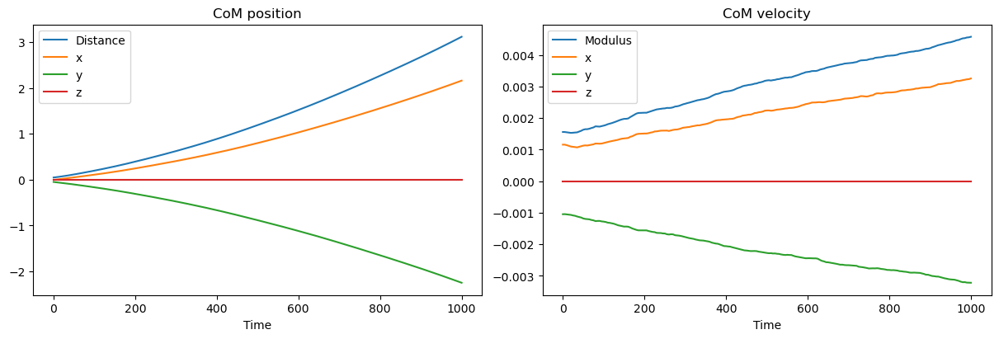

In [5]:
fig, (ax, bx) = plt.subplots(1, 2, figsize=(12, 4), layout='constrained')

plot = ax.plot(time, np.linalg.norm(r_CM, axis=-1))
plot.extend(ax.plot(time, r_CM))

ax.set_title('CoM position')
ax.set_xlabel('Time')
ax.legend(plot, ['Distance', 'x', 'y', 'z'])

plot = bx.plot(time, np.linalg.norm(v_CM, axis=-1))
plot.extend(bx.plot(time, v_CM))

bx.set_title('CoM velocity')
bx.set_xlabel('Time')
bx.legend(plot, ['Modulus', 'x', 'y', 'z'])

plt.show()

## MOVIE

In [6]:
master_dir = './FP_movies/'
images_dir = master_dir + 'images_d1_1/'
movie_path = master_dir + 'movie_d1_1.mp4'

In [7]:
dirpath = Path(images_dir)
if dirpath.exists() and dirpath.is_dir():
    shutil.rmtree(dirpath) # remove if existing
    os.makedirs(images_dir) # and create an empty one
else:
    os.makedirs(images_dir) # create new

In [8]:
step = 5

for i, t in enumerate(time[::step]):
    fig, (ax, bx) = plt.subplots(1, 2, figsize=(8, 4), layout='constrained') # NOTE: images must have even sides
    fig.suptitle('System name')

    ii = i * step
    
    ax.scatter(r_CMF[ii, 1:-1, 0], r_CMF[ii, 1:-1, 1], marker='.')
    ax.scatter(r_CMF[ii, 0, 0], r_CMF[ii, 0, 1], label='Central mass')
    ax.scatter(r_CMF[ii, -1, 0], r_CMF[ii, -1, 1], label='Perturber')
#    ax.quiver(r_CMF[ii, 1:, 0], r_CMF[ii, 1:, 1], v_CMF[ii, 1:, 0], v_CMF[ii, 1:, 1])
    
    ax.axis('equal')
    ax.set_xlim(-300, 300)
    ax.set_ylim(-300, 300)

    ax.set_title(f'Time = {t}')
    ax.legend(loc=1)

    bx.scatter(r_CMF[ii, 1:-1, 0], r_CMF[ii, 1:-1, 1], marker='.')
    bx.scatter(r_CMF[ii, 0, 0], r_CMF[ii, 0, 1], label='Central mass')
    bx.quiver(r_CMF[ii, 1:, 0], r_CMF[ii, 1:, 1], v_CMF[ii, 1:, 0], v_CMF[ii, 1:, 1])
    bx.scatter(r_CMF[ii, -1, 0], r_CMF[ii, -1, 1], label='Perturber')
    
    bx.axis('equal')
    bx.set_xlim(-50, 50)
    bx.set_ylim(-50, 50)

    bx.set_title('Zoom on central region')
    bx.legend(loc=1)

    plt.savefig(images_dir+'fig_'+str(i).zfill(5)+'.png', dpi=200)
    plt.close()

In [9]:
files = os.listdir(images_dir) # get the list of image files in the directory
files=sorted(files) # sort the files in alphanumeric order

with iio.get_writer(movie_path, mode='I', fps=12, quality=10) as writer:
    for file in files:
        filepath = os.path.join(images_dir, file)
        
        image = iio.imread(filepath)
        writer.append_data(image)
        
files=[]

In [10]:
# Source - https://stackoverflow.com/a/73823962
# Posted by holopekochan, modified by community. See post 'Timeline' for change history
# Retrieved 2026-06-23, License - CC BY-SA 4.0

from moviepy.editor import VideoFileClip

clip=VideoFileClip(movie_path)
clip.ipython_display(width=1000)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
